In [11]:
import torch
from torchvision.models import AlexNet
from torchvision import transforms
from PIL import Image

import matplotlib.pyplot as plt
import os
from torchsummary import summary

In [4]:
import torch
model = torch.hub.load('pytorch/vision:v0.10.0', 'alexnet', pretrained=True)
model.eval()

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to C:\Users\Lenovo/.cache\torch\hub\v0.10.0.zip
C:\Users\Lenovo\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Lenovo\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to C:\Users\Lenovo/.cache\torch\hub\checkpoints\alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:22<00:00, 10.9MB/s] 


AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [14]:
# sample execution (requires torchvision)
from PIL import Image
from torchvision import transforms


image_path = 'cat.jpg'
input_image = Image.open(image_path)
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model

# move the input and model to GPU for speed if available
if torch.cuda.is_available():
    input_batch = input_batch.to('cuda')
    model.to('cuda')

with torch.no_grad():
    output = model(input_batch)
# Tensor of shape 1000, with confidence scores over ImageNet's 1000 classes
print(output[0])
# The output has unnormalized scores. To get probabilities, you can run a softmax on it.
probabilities = torch.nn.functional.softmax(output[0], dim=0)
print(probabilities)

tensor([-3.1431e+00,  3.3737e-01, -5.1862e+00, -4.6080e+00, -4.4684e+00,
         2.0488e+00, -2.6424e+00,  1.3070e+00,  4.4013e+00, -2.0554e+00,
         3.7446e+00,  4.5761e+00,  5.7694e-01, -1.5456e+00,  1.1359e+00,
        -2.3187e+00,  1.7999e+00,  5.5330e+00, -9.0542e-02, -5.2925e+00,
        -7.0281e-01,  1.4668e+00, -1.9932e+00, -6.0267e-01, -2.4408e+00,
        -3.4813e+00,  1.5509e+00, -3.6465e+00, -2.2239e+00, -1.7956e+00,
        -3.9421e-01, -4.0037e+00, -2.3553e+00, -3.1595e+00, -1.6654e-01,
        -1.8616e+00,  1.6755e+00, -1.1365e+00, -7.8119e-01, -4.5110e+00,
        -2.0286e+00, -2.8603e+00, -2.6020e+00, -1.2608e+00, -1.8740e+00,
        -5.1441e+00, -1.0439e+00, -2.8672e-01, -4.3174e+00, -4.5465e+00,
        -6.5947e+00, -2.9041e+00, -1.3486e+00, -2.7331e+00, -3.1247e-01,
        -1.4271e+00, -3.2196e+00, -1.6708e+00, -3.5658e+00, -1.0045e+00,
        -2.6941e+00, -2.3077e+00, -2.9333e+00, -1.2038e+00, -3.5575e+00,
        -4.7512e+00, -7.8846e-01, -1.3981e+00,  2.2

In [15]:
# Read the categories
with open("labels.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]
# Show top categories per image
top5_prob, top5_catid = torch.topk(probabilities, 5)
for i in range(top5_prob.size(0)):
    print(categories[top5_catid[i]], top5_prob[i].item())

Egyptian cat 0.4580535590648651
kit fox 0.17173585295677185
Chihuahua 0.12888625264167786
weasel 0.04749787226319313
red fox 0.03288262337446213


In [20]:
# Define a function to hook into the chosen layer and extract feature maps
activation = {}

def hook_fn(module, input, output):
    activation['value'] = output

In [21]:
# Create a folder to save feature maps
output_folder = 'feature_maps_alexnet_4'
os.makedirs(output_folder, exist_ok=True)

In [22]:
# Create a folder to save filter visualizations
output_folder_filter= 'filter_visualizations_4'
os.makedirs(output_folder_filter, exist_ok=True)

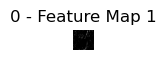

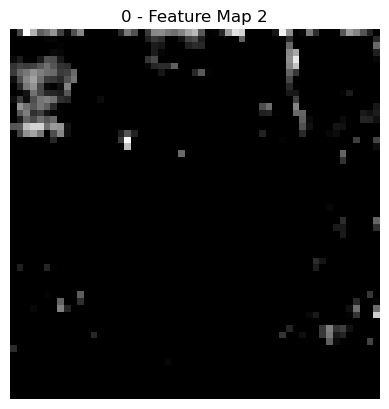

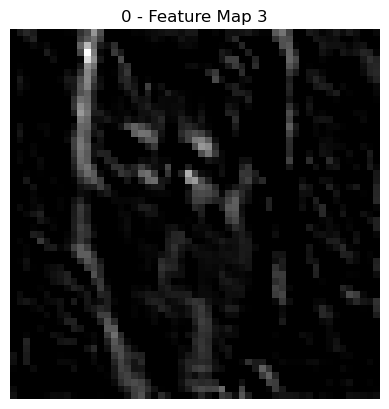

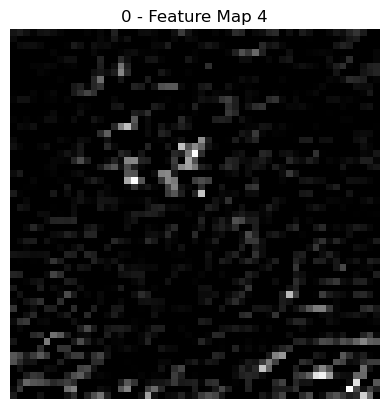

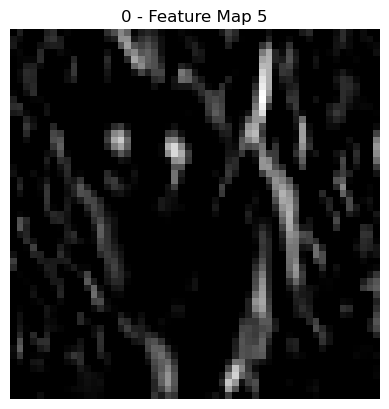

...

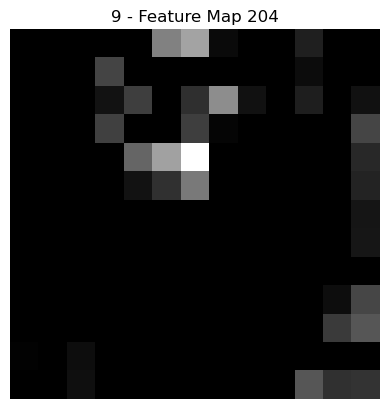

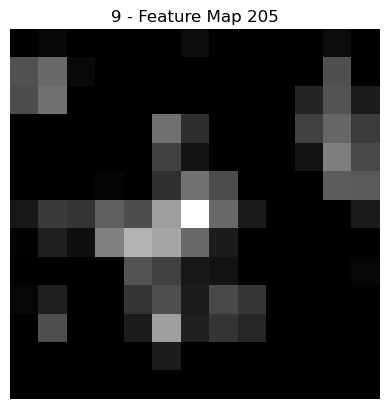

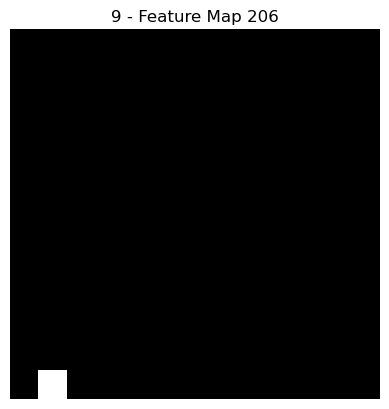

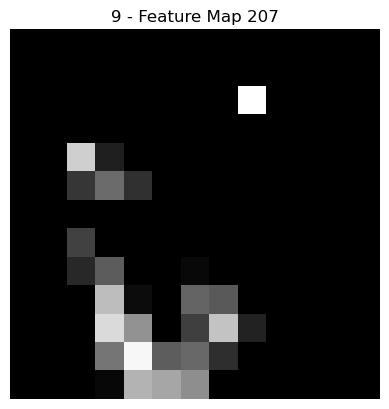

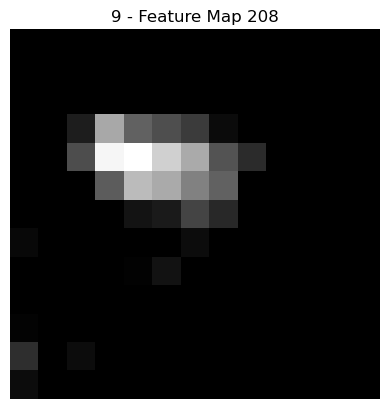

In [24]:
# Visualize feature maps for each layer
plt.figure(figsize=(20, 20))
for layer_name, layer in model.features._modules.items():
    hook = layer.register_forward_hook(hook_fn)
    
    with torch.no_grad():
        output = model(input_batch)
    feature_maps = activation['value'][0].detach()
    num_feature_maps = feature_maps.size(0)
    
    # Display feature maps in a grid for the current layer
    plt.subplot(num_feature_maps, 1, 1)
    for i in range(num_feature_maps):
        feature_map_image = feature_maps[i].cpu().numpy()
        image_path = os.path.join(output_folder, f'{layer_name}_feature_map_{i + 1}.png')
        plt.imsave(image_path, feature_map_image, cmap='gray')
        
        plt.imshow(feature_maps[i], cmap='gray')
        plt.title(f'{layer_name} - Feature Map {i + 1}')
        plt.axis('off')
        plt.show()
    
    hook.remove()